In [0]:
#Import Dataset 1
import pyspark
from pyspark.sql.functions import col,lit
from pyspark.sql.types import IntegerType

# File location and type
file_location_1 = "/FileStore/tables/esea_meta_demos_part1.csv" 
file_type_1 = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","


# The applied options are for CSV files. For other file types, these will be ignored.
df1 = spark.read.format(file_type_1) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location_1)

df1 = df1.drop(df1.start_seconds, df1.end_seconds, df1.winner_team, df1.winner_side, df1.round_type, df1.ct_eq_val, df1.t_eq_val)
#Maps are 'de_cache', 'de_dust2', 'de_inferno', 'de_mirage', 'de_nuke', 'de_overpass', 'de_train'
theMap = 'de_overpass'

df1 = df1.where(df1.map == theMap)
df1.printSchema()



root
 |-- file: string (nullable = true)
 |-- map: string (nullable = true)
 |-- round: string (nullable = true)



In [0]:
#Import Dataset 2
# File location and type
file_location_2 = "/FileStore/tables/esea_master_kills_demos_part1.csv" 
file_type_2 = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","


# The applied options are for CSV files. For other file types, these will be ignored.
df2 = spark.read.format(file_type_2) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location_2)


df2 = df2.drop("seconds", "att_team", "vic_team", "vic_side", "wp", "wp_type", "ct_alive", "t_alive", "is_bomb_planted")
df2.printSchema()
display(df2)

root
 |-- file: string (nullable = true)
 |-- round: string (nullable = true)
 |-- tick: string (nullable = true)
 |-- att_side: string (nullable = true)



file,round,tick,att_side
esea_match_13770997.dem,1,16058,CounterTerrorist
esea_match_13770997.dem,1,16210,Terrorist
esea_match_13770997.dem,1,16510,Terrorist
esea_match_13770997.dem,1,17104,CounterTerrorist
esea_match_13770997.dem,1,17338,Terrorist
esea_match_13770997.dem,1,17524,Terrorist
esea_match_13770997.dem,1,17814,CounterTerrorist
esea_match_13770997.dem,1,18662,CounterTerrorist
esea_match_13770997.dem,1,20000,Terrorist
esea_match_13770997.dem,2,26160,Terrorist


In [0]:
#Combine Dataset 1 & 2
import pyspark
from pyspark.sql.functions import col,lit, when

dfBig = df1.join(df2, (df1.file == df2.file) & (df1.round == df2.round)).drop(df2.file, df2.round)

dfBig.head()
display(dfBig)

file,map,round,tick,att_side
esea_match_13770997.dem,de_overpass,1,16058,CounterTerrorist
esea_match_13770997.dem,de_overpass,1,16210,Terrorist
esea_match_13770997.dem,de_overpass,1,16510,Terrorist
esea_match_13770997.dem,de_overpass,1,17104,CounterTerrorist
esea_match_13770997.dem,de_overpass,1,17338,Terrorist
esea_match_13770997.dem,de_overpass,1,17524,Terrorist
esea_match_13770997.dem,de_overpass,1,17814,CounterTerrorist
esea_match_13770997.dem,de_overpass,1,18662,CounterTerrorist
esea_match_13770997.dem,de_overpass,1,20000,Terrorist
esea_match_13770997.dem,de_overpass,2,26160,Terrorist


In [0]:
#Import Dataset 3
# File location and type
file_location_3 = "/FileStore/tables/esea_master_dmg_demos_part1.csv" 
file_type_3 = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","


# The applied options are for CSV files. For other file types, these will be ignored.
df3 = spark.read.format(file_type_3) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location_3)


df3 = df3.drop("seconds", "att_team", "vic_team", "att_side", "vic_side", "hp_dmg", "arm_dmg", "wp", "wp_type", "is_bomb_planted", "bomb_site", "hitbox", "att_id", "att_rank", "vic_id", "vic_rank", "vic_pos_x", "vic_pos_y")
df3.printSchema()
display(df3)

root
 |-- file: string (nullable = true)
 |-- round: string (nullable = true)
 |-- tick: string (nullable = true)
 |-- att_pos_x: string (nullable = true)
 |-- att_pos_y: string (nullable = true)



file,round,tick,att_pos_x,att_pos_y
esea_match_13770997.dem,1,14372,0.0,0.0
esea_match_13770997.dem,1,15972,-1499.69,63.33829
esea_match_13770997.dem,1,16058,-1066.874,3.4456300000000004
esea_match_13770997.dem,1,16066,-747.3146,-49.326809999999995
esea_match_13770997.dem,1,16108,-1501.861,49.19798
esea_match_13770997.dem,1,16188,-756.2186,-80.94859
esea_match_13770997.dem,1,16210,-751.6216,-55.697790000000005
esea_match_13770997.dem,1,16496,-1878.2420000000002,527.7095
esea_match_13770997.dem,1,16510,-1025.829,-487.7901
esea_match_13770997.dem,1,16514,-702.2363,93.98489000000001


In [0]:
#Combine Dataset 1 & 2 & 3
import pyspark
from pyspark.sql.functions import col,lit, when

dfBiggest = dfBig.join(df3, (dfBig.file == df3.file) & (dfBig.round == df3.round) & (dfBig.tick == df3.tick)).drop(df3.file, df3.round, df3.tick)

dfBiggest.head()
display(dfBiggest)

file,map,round,tick,att_side,att_pos_x,att_pos_y
esea_match_13779889.dem,de_overpass,22,260425,CounterTerrorist,-596.0226,213.5725
esea_match_13779889.dem,de_overpass,23,273893,CounterTerrorist,-882.5541,309.0555
esea_match_13779889.dem,de_overpass,25,293506,Terrorist,-1548.473,-529.7584
esea_match_13779889.dem,de_overpass,26,301590,CounterTerrorist,-1836.641,-966.6714
esea_match_13779889.dem,de_overpass,26,301590,CounterTerrorist,-1836.641,-966.6714
esea_match_13779889.dem,de_overpass,26,301590,CounterTerrorist,-1836.641,-966.6714
esea_match_13779889.dem,de_overpass,26,301590,CounterTerrorist,-1836.641,-966.6714
esea_match_13779889.dem,de_overpass,26,301590,CounterTerrorist,-1836.641,-966.6714
esea_match_13779932.dem,de_overpass,5,64468,CounterTerrorist,-2218.915,552.7426
esea_match_13779940.dem,de_overpass,21,263874,Terrorist,-1006.11,466.2792


In [0]:
#Import libraries needed for kNN
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from IPython.core.display import HTML
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler  

newdf = dfBiggest.toPandas()
newdf['att_side'] = np.where(newdf['att_side']=='Terrorist', 1,0)
newdf = newdf[['att_side','att_pos_x','att_pos_y']]

#Split data into training and test groups
X_train, X_test, y_train, y_test = train_test_split(newdf.drop(columns = ['att_side'], axis=1), newdf['att_side'], test_size=0.2, random_state=2018, shuffle=True)
print(X_train.shape)
print(X_test.shape)


(86744, 2)
(21686, 2)


In [0]:
#Create scaler for model
scaler = StandardScaler()  
scaler.fit(X_train)

X_train = scaler.transform(X_train)  
X_test = scaler.transform(X_test)  

In [0]:
#Determine neighbors value based on X_train shape
k= round(np.sqrt(X_train.shape[0]))
#k = 40

In [0]:
#Create kNN Model
knn = KNeighborsClassifier(n_neighbors=k)
knn = knn.fit(X_train, y_train)

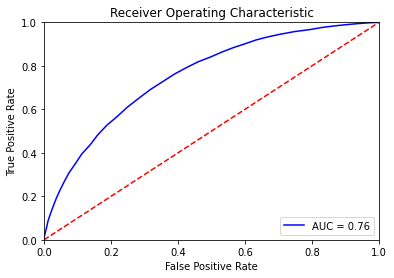

In [0]:
#Run prediction using the model
pred_test = knn.predict(X_test)
pred_test_prob = knn.predict_proba(X_test)

fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_test_prob[:,1])
roc_auc = metrics.auc(fpr, tpr)

#Plot Curve
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [0]:
#Return Accuracy of Model
from sklearn.metrics import accuracy_score
accuracy_score(y_test,pred_test)

Out[198]: 0.6854191644378862

In [0]:
#Make Confusion Matrix of Model
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,pred_test)

Out[199]: array([[8092, 3200],
       [3622, 6772]])

In [0]:
#Create Meshgrid for Boundary
a = np.arange(start=X_train[:,0].min()-0.5, stop=X_train[:,0].max()+0.5, step=0.01)
b = np.arange(start=X_train[:,1].min()-0.5, stop=X_train[:,1].max()+0.5, step=0.01)

XX,YY=np.meshgrid(a,b)


In [0]:
#Use kNN model with Meshgrid to form Boundary values
graph_input = np.array([XX.ravel(),YY.ravel()]).T
labels = knn.predict(graph_input)

Out[202]: <matplotlib.contour.QuadContourSet at 0x7fb84586dee0>

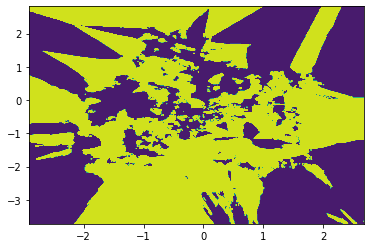

In [0]:
#Plot the Boundary
plt.contourf(XX,YY,labels.reshape(XX.shape))

Out[203]: <matplotlib.collections.PathCollection at 0x7fb8454de970>

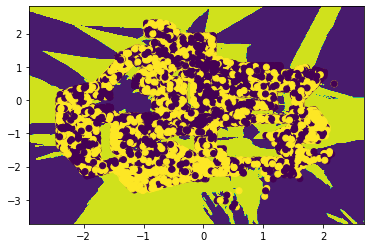

In [0]:
#Plot the Boundary with scatter plot of kills from X_train data
plt.contourf(XX,YY,labels.reshape(XX.shape))
plt.scatter(X_train[:,0],X_train[:,1], c=y_train)